## Radix Sort - MPI Strong Scaling and Speedup

In [1]:
# Jonathan Kutsch
import sys
sys.path.append("/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages")
sys.path.append("/scratch/group/csce435-f23/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd
import math
import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [2]:
# dataframes
tk = th.Thicket.from_caliperreader(glob("/scratch/user/jonathankutsch/radix/radix/build/*.cali"))
# tk.dataframe = tk.dataframe.drop(["spot.channel"], axis=1)
# tk.dataframe = tk.dataframe.drop(["Min time/rank"],axis=1)
# tk.dataframe = tk.dataframe.drop(["Max time/rank"],axis=1)
# tk.dataframe = tk.dataframe.drop(["Total time"],axis=1)
# tk.dataframe = tk.dataframe.drop(["Variance time/rank"],axis=1)
# tk.dataframe = tk.dataframe.drop(["nid"],axis=1)

In [3]:
# Performance data
tk.dataframe

nid  \
node                                              profile           
{'name': 'main', 'type': 'function'}              15253080      1   
                                                  20885860      1   
                                                  148334837     1   
                                                  157593170     1   
                                                  162219207     1   
                                                  180596001     1   
                                                  187456116     1   
                                                  222083088     1   
                                                  225194923     1   
                                                  228205184     1   
                                                  254092752     1   
                                                  264061812     1   
                                                  298537899     1   
                                                  334108191     1   
                                                  348959619     1   
                                                  394559370     1   
                                                  427559273     1   
                                                  439549323     1   
                                                  507155105     1   
                                                  561188750     1   
                                                  594481608     1   
                                                  597785548     1   
                                                  611159881     1   
                                                  619610176     1   
                                                  633341042     1   
                                                  633719008     1   
                                                  677144255     1   
                                                  680785466     1   
                                                  688822776     1   
                                                  732990297     1   
                                                  760216472     1   
                                                  805253931     1   
                                                  818114101     1   
                                                  829527828     1   
                                                  843055466     1   
                                                  850109765     1   
                                                  869904116     1   
                                                  877675101     1   
                                                  884381071     1   
                                                  899079545     1   
                                                  904927144     1   
                                                  910292345     1   
                                                  927373825     1   
                                                  929138848     1   
                                                  942559326     1   
                                                  957985469     1   
                                                  982090299     1   
                                                  1003908599    1   
                                                  1014961830    1   
                                                  1027112214    1   
                                                  1028593855    1   
                                                  1029550570    1   
                                                  1032679434    1   
                                                  1072146063    1   
                                                  1075008866    1   
                                                  1083248769    1   
                                                  1180143342

In [4]:
#Printing Thicket Tree
tk.statsframe.dataframe["time"] = 1
print(tk.tree())

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2023.3.0

1.000 main
└─ 1.000 whole_computation
   ├─ 1.000 check_correctness
   ├─ 1.000 comm
   │  └─ 1.000 comp_large
   │     └─ 1.000 comm_large
   ├─ 1.000 comp
   │  └─ 1.000 comp_large
   │     └─ 1.000 comm_large
   └─ 1.000 data_init

Legend (Metric: time Min: 1.00 Max: 1.00)
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00

name User code    ◀  Only in left graph    ▶  Only in right graph



In [5]:
tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:time.variance,launchdate,libraries,cmdline,cluster,Algorithm,ProgrammingModel,Datatype,SizeOfDatatype,InputSize,InputType,num_procs,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,
15253080,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
20885860,2.11.0-dev,256,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a4194304-p256-i1.cali,true,1701452040,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 4194304, 1, 256]",c,Radix Sort,MPI,int,4,4194304,Random,256,9,Online
148334837,2.11.0-dev,512,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p512-i1.cali,true,1701453141,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 1, 512]",c,Radix Sort,MPI,int,4,1048576,Random,512,9,Online
157593170,2.11.0-dev,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a65536-p32-i3.cali,true,1701454082,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 65536, 3, 32]",c,Radix Sort,MPI,int,4,65536,1%%perturbed,32,9,Online
162219207,2.11.0-dev,1024,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p1024-i1.cali,true,1701457306,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 1, 1024]",c,Radix Sort,MPI,int,4,1048576,Random,1024,9,Online
180596001,2.11.0-dev,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a65536-p128-i3.cali,true,1701451379,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 65536, 3, 128]",c,Radix Sort,MPI,int,4,65536,1%%perturbed,128,9,Online
187456116,2.11.0-dev,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a262144-p16-i0.cali,true,1701454282,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 262144, 0, 16]",c,Radix Sort,MPI,int,4,262144,Sorted,16,9,Online
222083088,2.11.0-dev,2,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a262144-p2-i1.cali,true,1701454204,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 262144, 1, 2]",c,Radix Sort,MPI,int,4,262144,Random,2,9,Online
225194923,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a16777216-p64-i1.cali,true,1701457061,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 16777216, 1, 64]",c,Radix Sort,MPI,int,4,16777216,Random,64,9,Online


In [6]:
# gb = tk.groupby("InputSize")
df = pd.merge(tk.dataframe, tk.metadata, left_on='profile', right_index=True)
df

,,nid,spot.channel,Min time/rank,Max time/rank,Avg time/rank,Total time,Variance time/rank,name,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:time.variance,launchdate,libraries,cmdline,cluster,Algorithm,ProgrammingModel,Datatype,SizeOfDatatype,InputSize,InputType,num_procs,group_num,implementation_source
node,profile,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"{'name': 'main', 'type': 'function'}",15253080,1,regionprofile,0.464636,12.105701,0.778511,49.824734,2.040328,main,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'whole_computation', 'type': 'function'}",15253080,2,regionprofile,0.464590,12.105655,0.778463,49.821626,2.040329,whole_computation,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'check_correctness', 'type': 'function'}",15253080,10,regionprofile,0.000125,0.000258,0.000145,0.009270,0.000000,check_correctness,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comm', 'type': 'function'}",15253080,7,regionprofile,0.280953,11.913312,0.587362,37.591178,2.039653,comm,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comp_large', 'type': 'function'}",15253080,8,regionprofile,0.190113,11.650813,0.370694,23.724398,2.019700,comp_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comm_large', 'type': 'function'}",15253080,9,regionprofile,10.884277,10.884277,10.884277,10.884277,0.000000,comm_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comp', 'type': 'function'}",15253080,4,regionprofile,0.178329,0.232697,0.185284,11.858166,0.000046,comp,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comp_large', 'type': 'function'}",15253080,5,regionprofile,0.178314,0.232683,0.185270,11.857284,0.000046,comp_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701449276,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comm_large', 'type': 'function'}",15253080,6,regionprofile,0.169411,0.219940,0.172606,11.046802,0.000038,comm_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#

In [7]:
# ctk = th.Thicket.concat_thickets(
#     thickets=list(gb.values()),
#     headers=list(gb.keys()),
#     axis="columns",
#     metadata_key="num_procs"
# )

In [8]:
# ctk.dataframe

In [9]:
# # Drop unwanted columns
# #ctk.dataframe = ctk.dataframe.reset_index().drop([("node", ""), (("1%%perturbed",65536), "nid"), (("1%%perturbed",65536),"Min time/rank"), (("1%%perturbed",65536),"Max time/rank"), (("1%%perturbed",65536),"Total time"), (("1%%perturbed",65536),"Variance time/rank"), (("Random",65536),"nid"), (("Random",65536),"Min time/rank"), (("Random",65536),"Max time/rank"), (("Random",65536),"Total time"), (("Random",65536),"Variance time/rank"),(("Sorted",65536),"nid"),(("Sorted",65536),"Min time/rank"), (("Sorted",65536),"Max time/rank"), (("Sorted",65536),"Total time"), (("Sorted",65536),"Variance time/rank"),(("ReverseSorted",65536),"nid"),(("ReverseSorted",65536),"Min time/rank"), (("ReverseSorted",65536),"Max time/rank"), (("ReverseSorted",65536),"Total time"), (("ReverseSorted",65536),"Variance time/rank") ], axis=1)
# #ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",262144), "nid"), (("1%%perturbed",262144),"Min time/rank"), (("1%%perturbed",262144),"Max time/rank"), (("1%%perturbed",262144),"Total time"), (("1%%perturbed",262144),"Variance time/rank"), (("Random",262144),"nid"), (("Random",262144),"Min time/rank"), (("Random",262144),"Max time/rank"), (("Random",262144),"Total time"), (("Random",262144),"Variance time/rank"),(("Sorted",262144),"nid"),(("Sorted",262144),"Min time/rank"), (("Sorted",262144),"Max time/rank"), (("Sorted",262144),"Total time"), (("Sorted",262144),"Variance time/rank"),(("ReverseSorted",262144),"nid"),(("ReverseSorted",262144),"Min time/rank"), (("ReverseSorted",262144),"Max time/rank"), (("ReverseSorted",262144),"Total time"), (("ReverseSorted",262144),"Variance time/rank") ], axis=1)
# #ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",1048576), "nid"), (("1%%perturbed",1048576),"Min time/rank"), (("1%%perturbed",1048576),"Max time/rank"), (("1%%perturbed",1048576),"Total time"), (("1%%perturbed",1048576),"Variance time/rank"), (("Random",1048576),"nid"), (("Random",1048576),"Min time/rank"), (("Random",1048576),"Max time/rank"), (("Random",1048576),"Total time"), (("Random",1048576),"Variance time/rank"),(("Sorted",1048576),"nid"),(("Sorted",1048576),"Min time/rank"), (("Sorted",1048576),"Max time/rank"), (("Sorted",1048576),"Total time"), (("Sorted",1048576),"Variance time/rank"),(("ReverseSorted",1048576),"nid"),(("ReverseSorted",1048576),"Min time/rank"), (("ReverseSorted",1048576),"Max time/rank"), (("ReverseSorted",1048576),"Total time"), (("ReverseSorted",1048576),"Variance time/rank") ], axis=1)
# #ctk.dataframe = ctk.dataframe.drop([("index","")], axis=1)

# ctk.dataframe = ctk.dataframe.reset_index().drop([("node", "")], axis=1)
# ctk.dataframe = ctk.dataframe.rename({("name", ""): "name", ("num_procs", ""): "num_procs"}).set_index(["name", "num_procs"])

In [10]:
# ctk.dataframe

In [11]:
# # Define common variables
# function_names = set(ctk.dataframe.index.get_level_values("name"))
# threads = sorted(list(set(ctk.dataframe.index.get_level_values("num_procs"))))
# inputsizes = sorted(list(set(tk.metadata["InputSize"].to_list())))
# inputtypes = sorted(list(set(tk.metadata["InputType"].to_list())))

In [12]:
# ctk.dataframe

In [13]:
# Plotting

In [14]:
# Option 1

In [15]:
# Use pandas.DataFrame.plot to automatically interface with matplotlib

In [16]:
# def plot_pandas(df, title, xlabel, ylabel, loglog):
#     plot = df.plot(kind="line", 
#         marker='o', 
#         title=title, 
#         xlabel=xlabel,
#         ylabel=ylabel, 
#         grid=True,
#         loglog=loglog
#     )
#     legend = plot.legend(loc='upper center', fontsize='x-small')
#     return plot

In [17]:
# Option 2

In [18]:
# Use matplotlib.pyplot directly for more fine-grained control. Specifically for our case we can change the x axis scaling from base 10 to base 2.

In [19]:
# def plot_mpl(df, title, xlabel, ylabel):
#     fig = plt.figure()
#     ax = fig.add_subplot(1, 1, 1)
#     ax.plot(
#         df,
#         marker='o',
#     )
#     ax.set_title(title)
#     ax.set_xlabel(xlabel)
#     ax.set_ylabel(ylabel)
#     ax.legend(matrix_sizes)
#     plt.grid(True)
#     plt.yscale("log", base=2)
#     plt.xscale("log", base=2)
#     plt.xticks(threads)
#     plt.show()
#     return fig, ax

In [20]:
# Graphs

In [21]:
# ctk.dataframe.loc["main"]

In [22]:
# Strong Scaling

In [23]:
def plot_strong(df):
    for inputSize in [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]:
        x = int(math.log2(inputSize))
        for region in ["main", "comp_large", "comm"]:
            plt.figure(figsize=(8, 5))

            plot_df = df[(df['InputSize'] == inputSize) & (df['name'] == region)]

            for inputType in plot_df['InputType'].unique():
                loop_df = plot_df[plot_df['InputType'] == inputType]
                
                group = loop_df.groupby('num_procs')['Avg time/rank'].mean()
                
                plt.plot(group, label=f'{inputType}')

            plt.title(f'Strong_Scaling_MPI_{region}_Input_Type_{inputType}')
            plt.xlabel('Processors')
            plt.ylabel('Time (seconds)')
            plt.xscale('log', base=2)
            plt.legend()
            plt.grid(True)
            plt.savefig(f"Strong_Scaling_MPI_{region}_Input Type_{inputType}.png")
            plt.show()

In [24]:
#Strong Scaling Speedup

In [25]:
def plot_speedup(df):
    for inputType in ["Random", "Sorted", "ReverseSorted", "1%%perturbed"]:
        for region in ["main", "comp_large", "comm"]:
            plt.figure(figsize=(8, 5))
            
            plot_df = df[(df['InputType'] == inputType) & (df['name'] == region)]

            for inputSize in sorted(plot_df['InputSize'].unique()):
                x = int(math.log2(inputSize))
                
                loop_df = plot_df[plot_df['InputSize'] == inputSize]
                
                baseline = loop_df[loop_df['num_procs'] == 2]['Avg time/rank'].mean()
            
                group = loop_df.groupby('num_procs')['Avg time/rank'].mean()
                group = baseline / group
                
                plt.plot(group, label=f'2^{x} elements')
                
            plt.title(f'Strong_Scaling_Speedup_MPI_{region}_Input_Type_{inputType}')
            plt.xlabel('Processors')
            plt.ylabel('Speedup')
            plt.xscale('log', base=2)
            plt.legend()
            plt.grid(True)
            plt.savefig(f"Strong_Scaling_Speedup_MPI_{region}_Input_Type_{inputType}.png")
            plt.show()

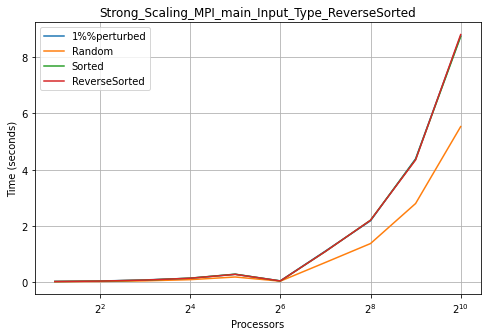

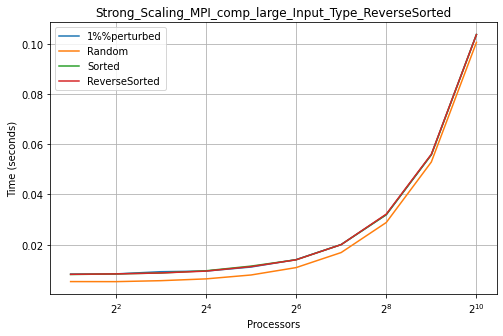

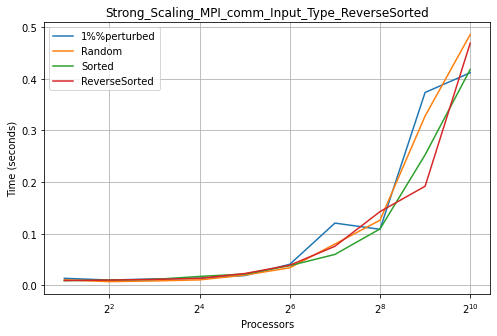

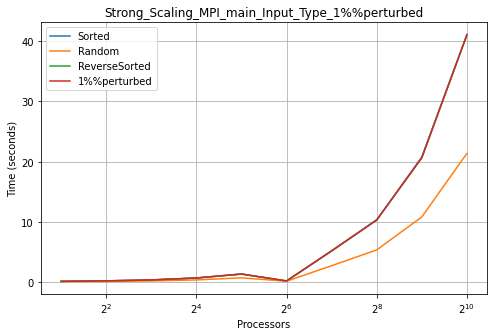

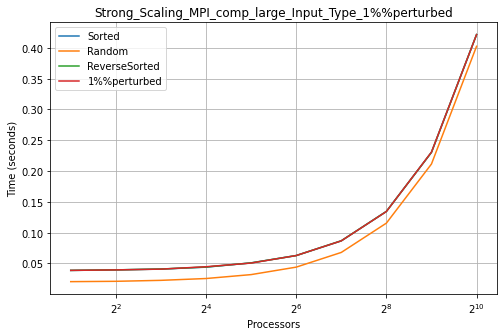

...

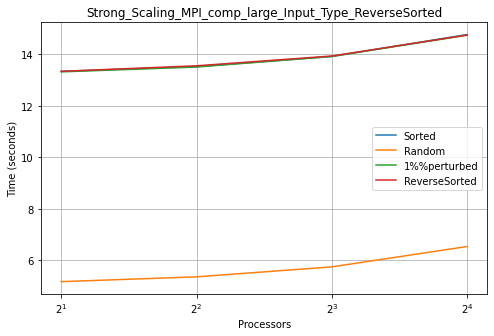

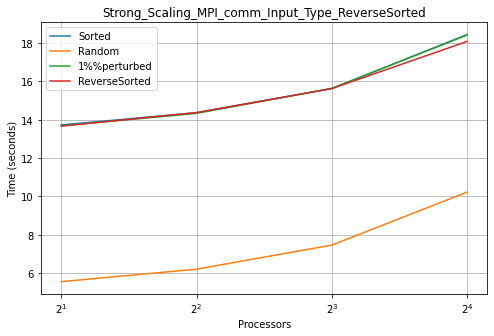

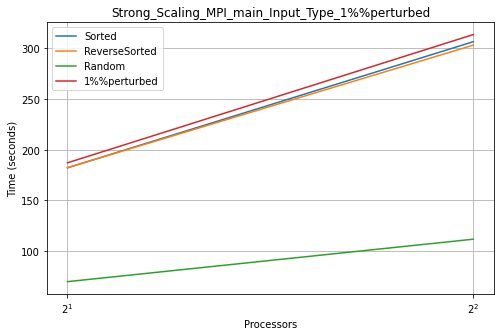

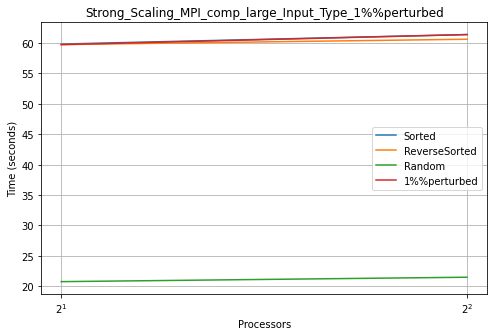

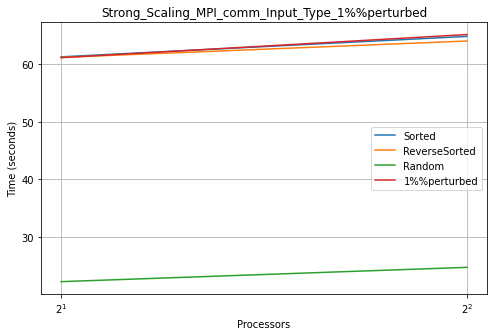

In [26]:
plot_strong(df)

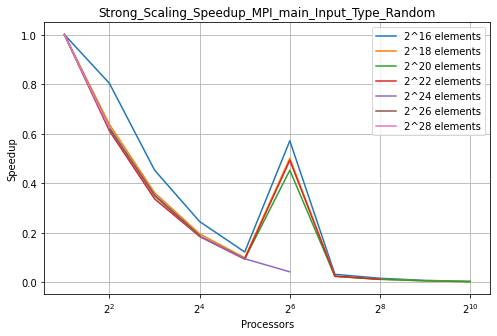

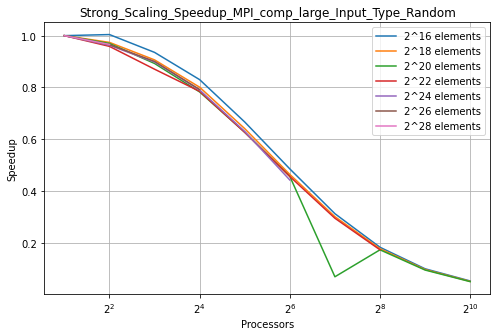

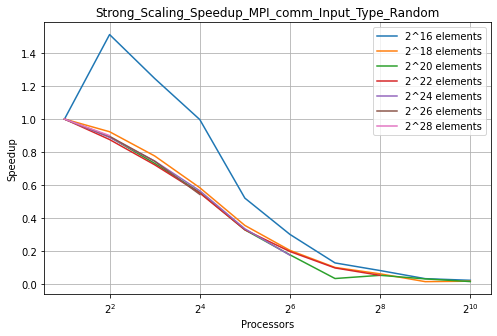

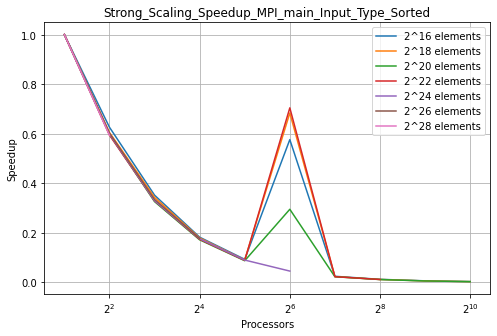

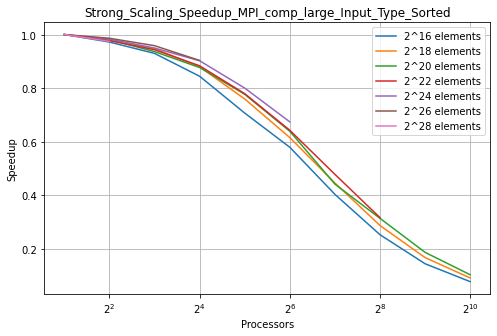

...

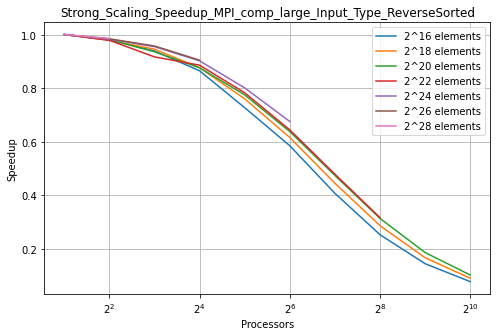

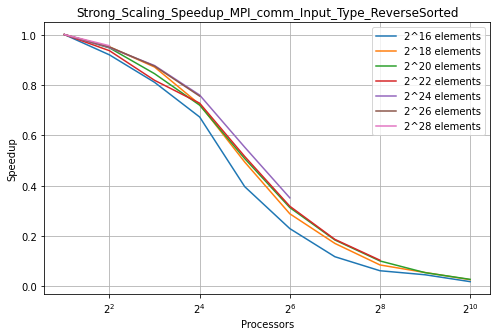

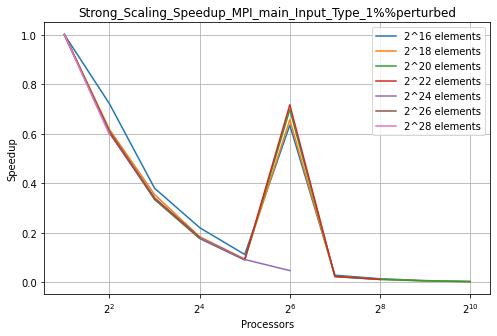

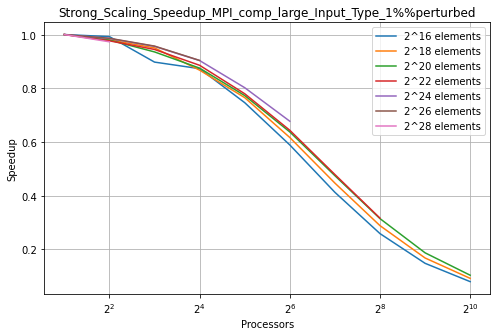

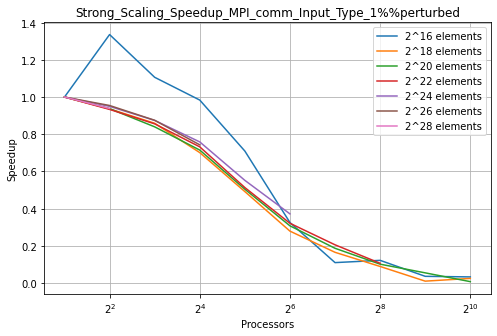

In [27]:
plot_speedup(df)